# Correlated Nash equilibria payoff sets
Vitor Farinha Luz\
ECON 601

This code:
1. Finds all possible correlated equilibria in a finite grid and plots the related payoffs
2. Includes Nash equilibria payoffs in the same plot

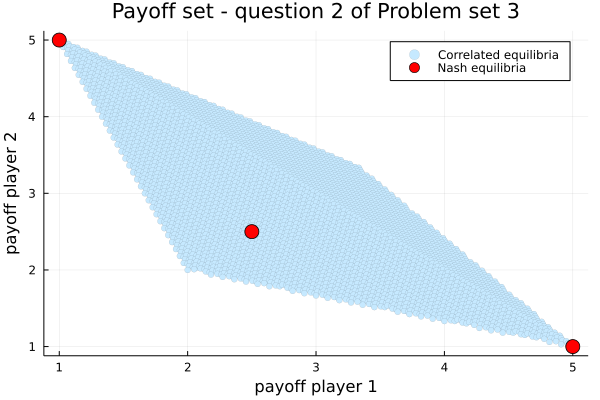

In [6]:
using Plots

# Creating a finite grid of possible probabilities for each action profile:
ngrid=100
P=LinRange(0,1,ngrid)
Q=LinRange(0,1,ngrid)
R=LinRange(0,1,ngrid)


# Going over all possible combinations of probabilities to check whether it corresponds to a Correlated equilibrium
#  and, if so, save the connected payoffs

payoffList=Vector{Tuple}() #Empty vector to be filled

for p in P, q in Q, r in R
    if (
        p+q+r ≤1 && # Probability 1-p-q is in [0,1]

        5*p ≥ 4*p + 1*q && # Player 1 U incentive

        4*r + (1-p-q-r) ≥ 5*r && # Player 1 D incentive

        1*p + 4*r ≥ 5*r && # Player 2 L incentive

        5*(1-p-q-r) ≥ 1*q + 4*(1-p-q-r) # Player 2 R incentive
        )
        
        #Calculate equilibrium payoff profile and stores it
        push!(payoffList,
        p.*(5,1) .+ q.*(0,0) .+r.*(4,4) .+ (1 .-p .-q .-r).*(1,5)
        ) 
    end
end

#Turns this list of payoffs into a matrix for plotting
payoffMat=[payoffList[i][j] for i in 1:size(payoffList,1), j in [1,2]]

#Plotting correlated equilibria payoffs:
p=scatter(payoffMat[:,1],payoffMat[:,2],
color=colorant"#C6E9FF",
markerstrokewidth=0,
label="Correlated equilibria",
xlabel="payoff player 1",
ylabel="payoff player 2",
title="Payoff set - question 2 of Problem set 3")

#Adding Nash equilibrium payoffs:
p=scatter!([5,1,2.5],[1,5,2.5],
color=:red,
markersize=8,
label="Nash equilibria")

savefig("Correlated_Nash.pdf")
display(p)